In [1]:
!pip install tensorflow matplotlib pandas

In [2]:
import tensorflow as tf
import numpy as np
from PIL import Image, ImageDraw, ImageOps
import matplotlib.pyplot as plt
import pandas as pd
import os
import cv2
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [3]:
from src.pipeline.pose_engine import PoseEngine
from src.pipeline.fall_detect import FallDetector

In [4]:
def _fall_detect_config_movenet():

    config = {
        'model': {
            'tflite': 'ai_models/lite-model_movenet_singlepose_thunder_3.tflite',
            },
        'labels': 'ai_models/pose_labels.txt',
        'confidence_threshold': 0.6,
        'model_name':'movenet'
    }
    return config

In [5]:
def _fall_detect_config_mobilenet():

    config = {
        'model': {
            'tflite': 'ai_models/posenet_mobilenet_v1_100_257x257_multi_kpt_stripped.tflite',
            },
        'labels': 'ai_models/pose_labels.txt',
        'confidence_threshold': 0.6,
        'model_name':'mobilenet'
    }
    return config


In [6]:
movenet_config = _fall_detect_config_movenet()
movenet_fall_detector = FallDetector(**movenet_config)
movenet_pose_engine = PoseEngine(movenet_fall_detector._tfengine, movenet_config['model_name'])

mobilenet_config = _fall_detect_config_mobilenet()
mobilenet_fall_detector = FallDetector(**mobilenet_config)
mobilenet_pose_engine = PoseEngine(mobilenet_fall_detector._tfengine, mobilenet_config['model_name'])

# Posenet Vs Movenet

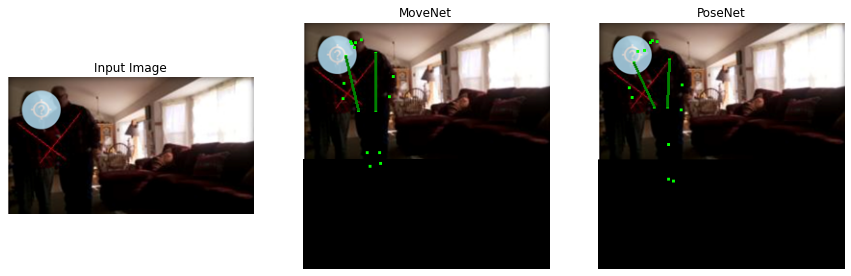


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.681930         0.584232    0.564108    0.636249   
posenet         0.693424         0.361835    0.746721    0.579940   

         Inference_time  
movenet        0.267194  
posenet        0.169821  



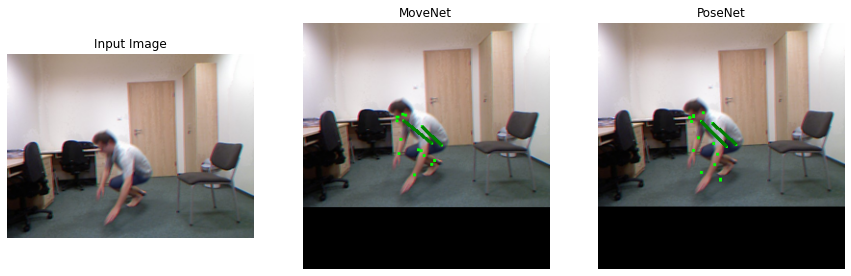


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.551457         0.685538    0.571250    0.497153   
posenet         0.984250         0.821950    0.874787    0.944533   

         Inference_time  
movenet        0.267356  
posenet        0.152350  



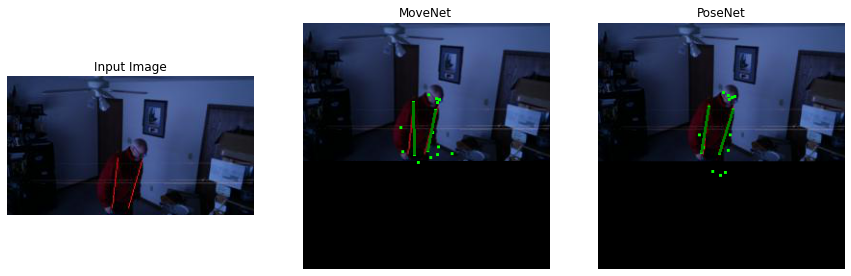


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.514819         0.482569    0.634595    0.475725   
posenet         0.816953         0.787055    0.619340    0.432841   

         Inference_time  
movenet        0.187014  
posenet        0.109592  



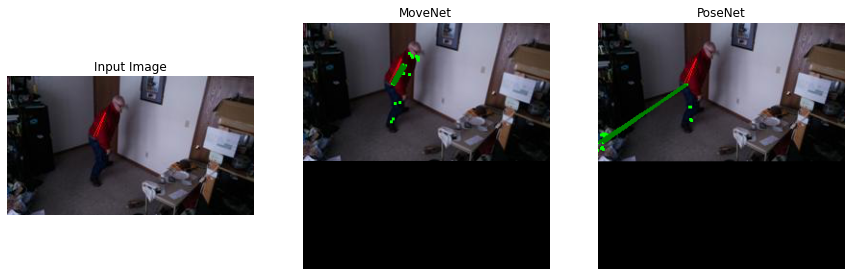


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.293247         0.280728    0.428216    0.462449   
posenet         0.080133         0.064593    0.137335    0.169320   

         Inference_time  
movenet        0.196607  
posenet        0.093473  



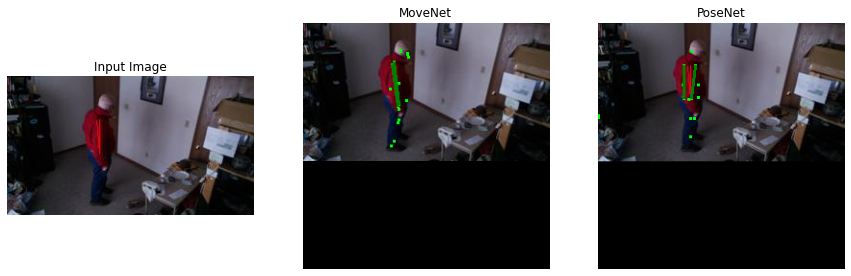


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.291344         0.409784    0.505634    0.557060   
posenet         0.358750         0.380527    0.474331    0.578293   

         Inference_time  
movenet        0.181118  
posenet        0.090912  



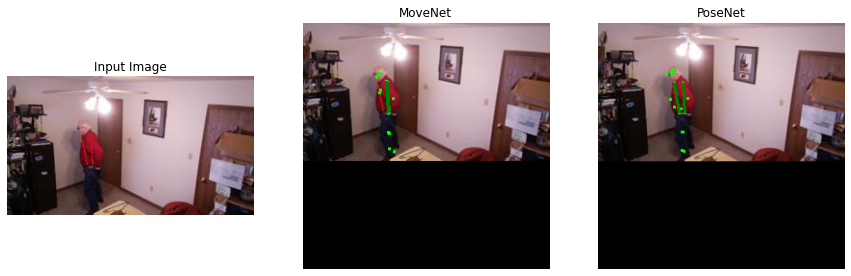


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.385434         0.443161    0.457041    0.452208   
posenet         0.993103         0.882560    0.989262    0.947945   

         Inference_time  
movenet        0.168069  
posenet        0.092438  



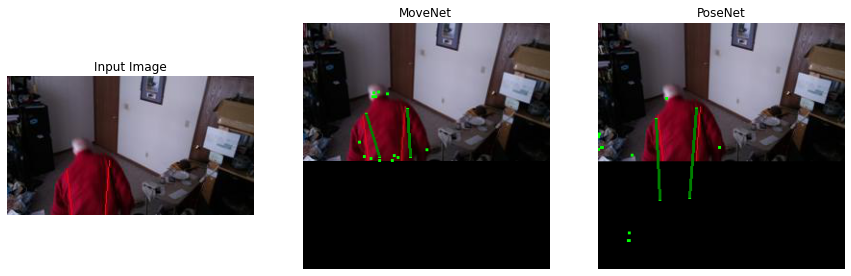


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.579216         0.608703    0.172724    0.137665   
posenet         0.437934         0.132671    0.211096    0.093292   

         Inference_time  
movenet        0.190507  
posenet        0.114117  



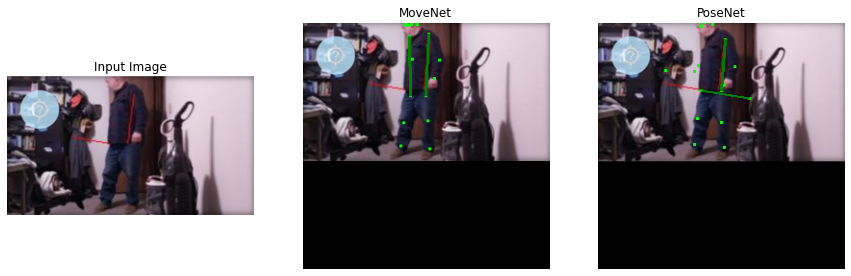


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.671805         0.560217    0.708826    0.771403   
posenet         0.994041         0.837409    0.998104    0.975233   

         Inference_time  
movenet        0.205295  
posenet        0.113277  



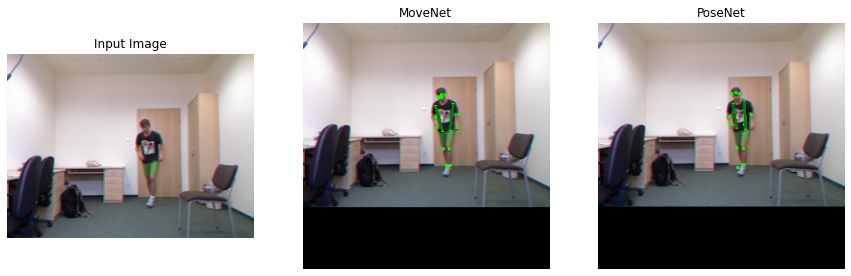


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.574028         0.661798    0.480063    0.483903   
posenet         0.966646         0.948529    0.926106    0.748626   

         Inference_time  
movenet        0.213404  
posenet        0.122540  



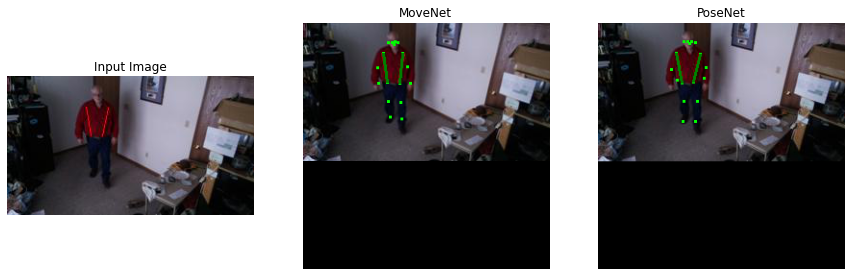


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.404683         0.323302    0.628407    0.531736   
posenet         0.994282         0.981373    0.995236    0.992494   

         Inference_time  
movenet        0.226397  
posenet        0.126541  



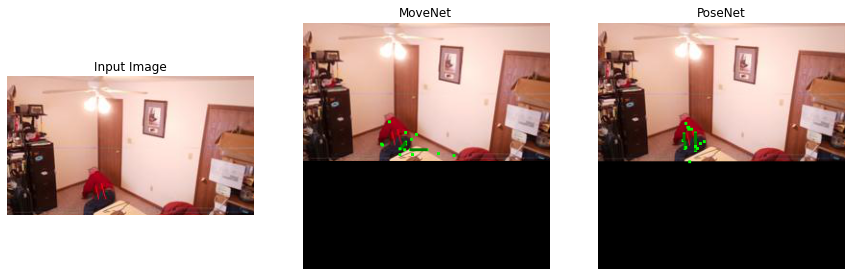


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.060427         0.090580    0.245573    0.340671   
posenet         0.064809         0.060697    0.029433    0.048051   

         Inference_time  
movenet        0.180135  
posenet        0.089526  



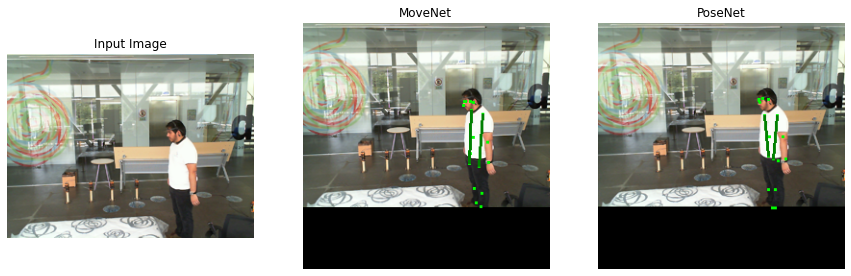


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.576427         0.593523    0.652052    0.692572   
posenet         0.999428         0.971296    0.929319    0.827800   

         Inference_time  
movenet        0.202330  
posenet        0.121488  



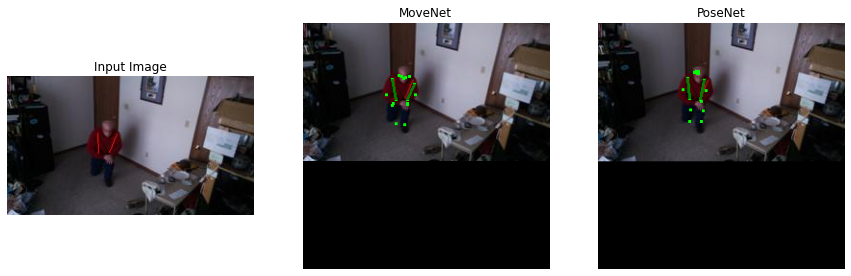


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.482163         0.407907    0.389751    0.356105   
posenet         0.676122         0.718254    0.509295    0.618937   

         Inference_time  
movenet        0.165663  
posenet        0.110023  



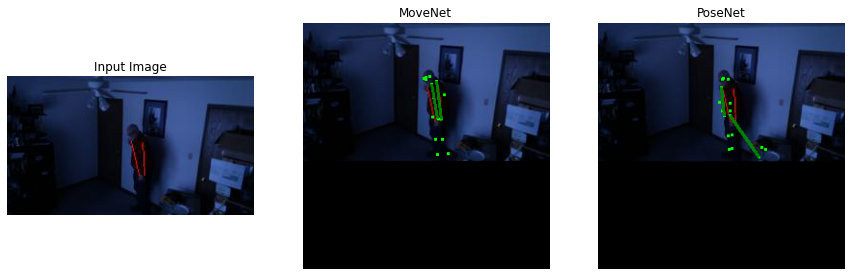


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.411386         0.387540    0.387879    0.432137   
posenet         0.028315         0.037679    0.026444    0.043686   

         Inference_time  
movenet        0.184082  
posenet        0.110842  



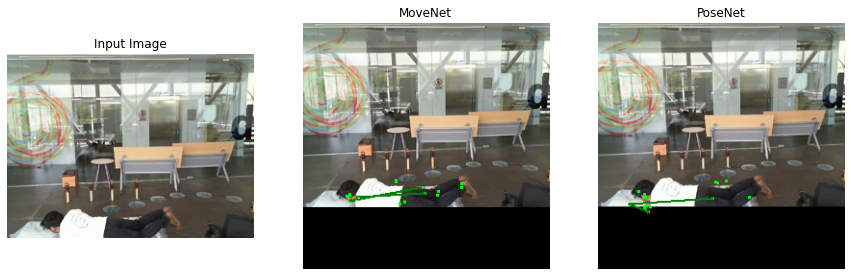


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.272308         0.308843    0.197491    0.171467   
posenet         0.011118         0.017692    0.005691    0.006544   

         Inference_time  
movenet        0.228172  
posenet        0.149690  



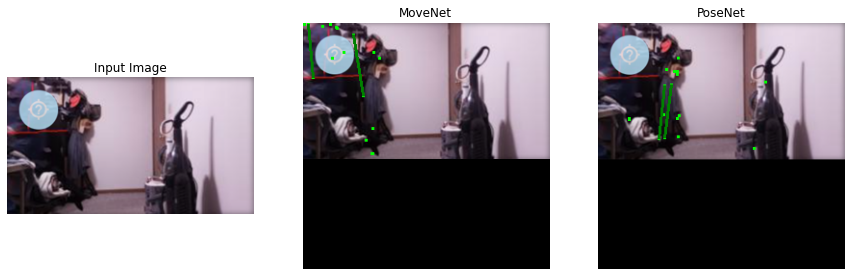


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.065165         0.159040    0.078886    0.121895   
posenet         0.640908         0.661787    0.309637    0.311637   

         Inference_time  
movenet        0.248731  
posenet        0.157594  



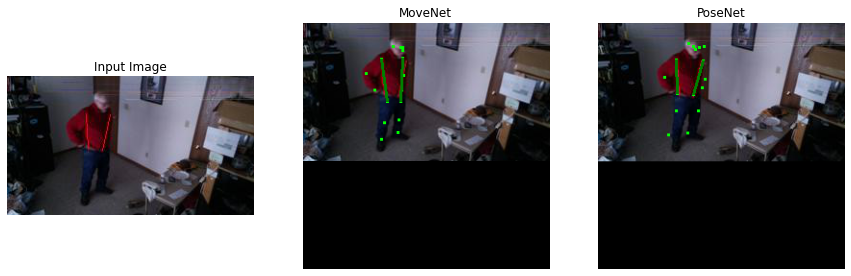


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.475422         0.576229    0.795357    0.678322   
posenet         0.522550         0.907768    0.935941    0.754716   

         Inference_time  
movenet        0.222108  
posenet        0.110372  



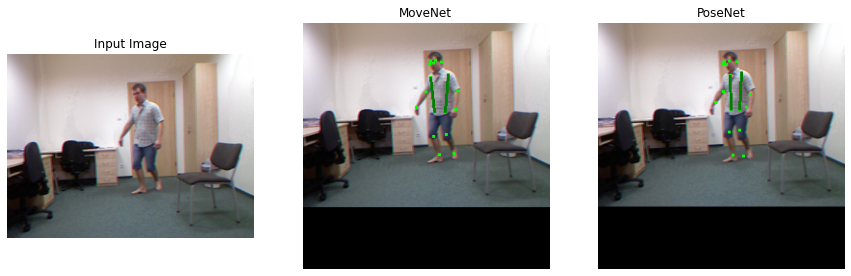


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.722023         0.518078    0.559009    0.590755   
posenet         0.993478         0.997292    0.993563    0.996355   

         Inference_time  
movenet        0.205859  
posenet        0.090096  



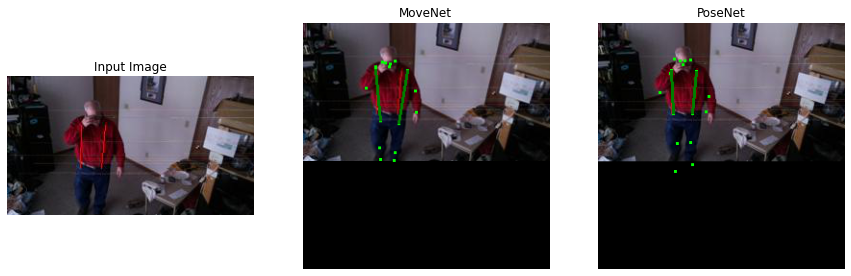


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.463635         0.651494    0.533021    0.667355   
posenet         0.990964         0.883968    0.999335    0.954334   

         Inference_time  
movenet        0.230909  
posenet        0.126449  



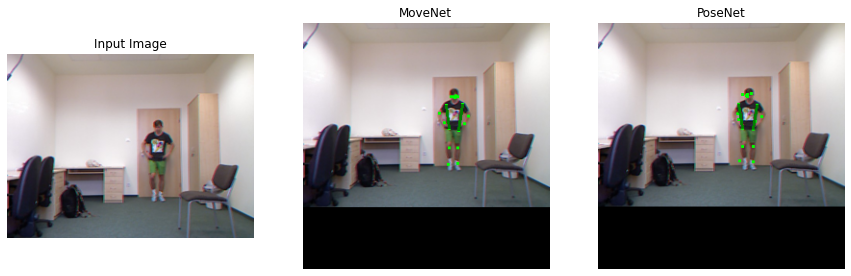


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.649309         0.577869    0.570143    0.533052   
posenet         0.984572         0.941343    0.940407    0.924790   

         Inference_time  
movenet        0.208392  
posenet        0.110912  



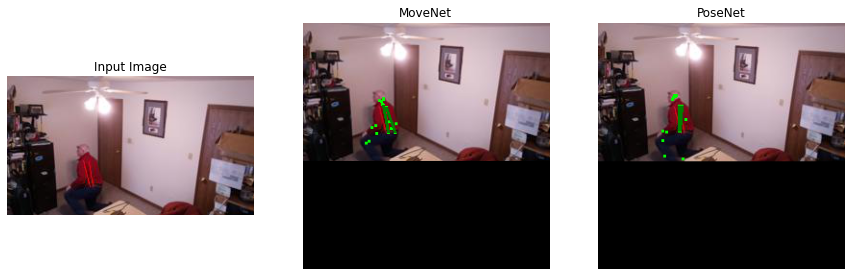


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.351813         0.285502    0.257873    0.301363   
posenet         0.789852         0.866329    0.808955    0.776207   

         Inference_time  
movenet        0.176656  
posenet        0.151866  



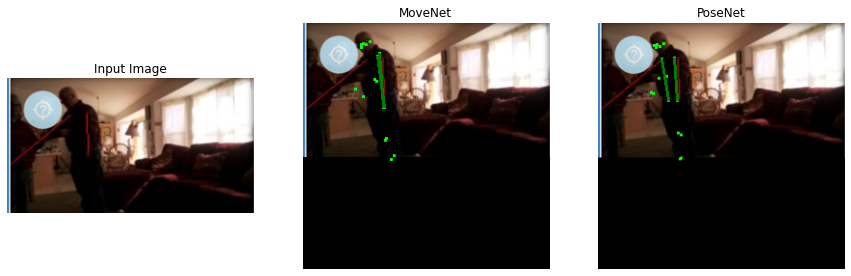


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.698905         0.492374    0.528614    0.548246   
posenet         0.955995         0.962668    0.846824    0.864783   

         Inference_time  
movenet        0.189361  
posenet        0.111552  



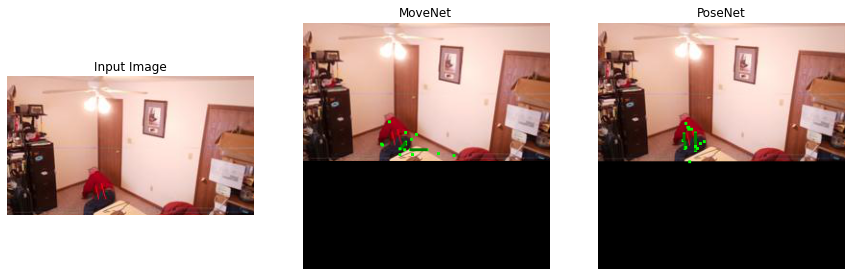


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.060427         0.090580    0.245573    0.340671   
posenet         0.064809         0.060697    0.029433    0.048051   

         Inference_time  
movenet        0.257424  
posenet        0.172761  



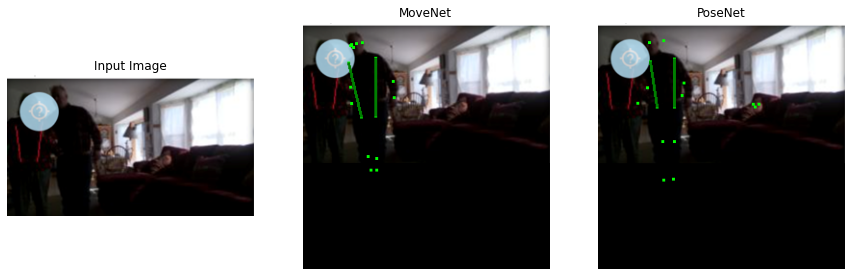


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.705921         0.629297    0.577361    0.644588   
posenet         0.890897         0.707792    0.991340    0.855217   

         Inference_time  
movenet        0.221613  
posenet        0.138075  



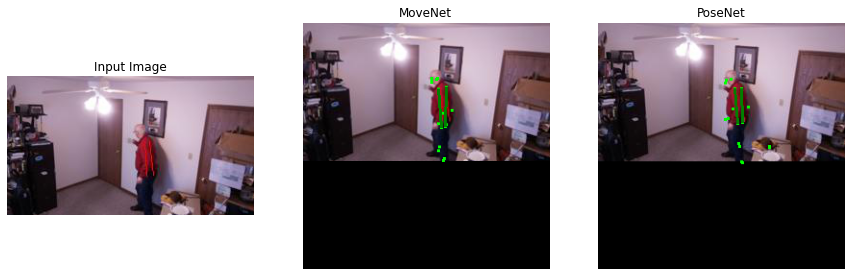


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.709016         0.488555    0.673661    0.542463   
posenet         0.832334         0.937849    0.724507    0.842540   

         Inference_time  
movenet        0.209409  
posenet        0.114552  



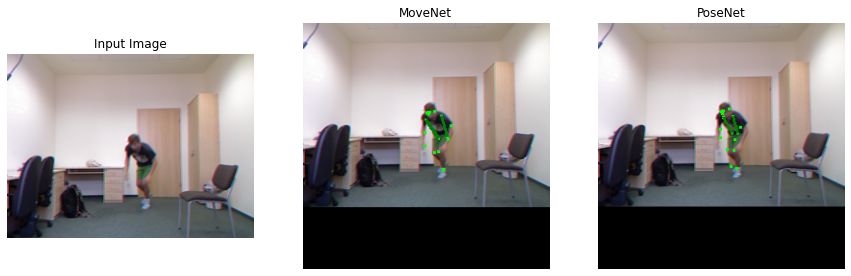


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.467571         0.432706    0.533694    0.443867   
posenet         0.938513         0.992204    0.895669    0.907810   

         Inference_time  
movenet        0.202342  
posenet        0.117777  



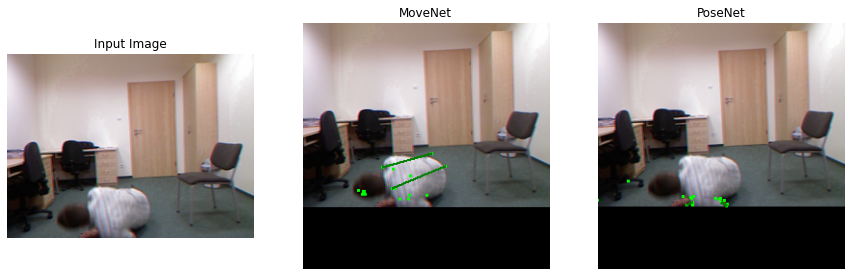


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.203492         0.159095    0.293808    0.355325   
posenet         0.004774         0.005587    0.001251    0.001916   

         Inference_time  
movenet        0.272852  
posenet        0.142960  



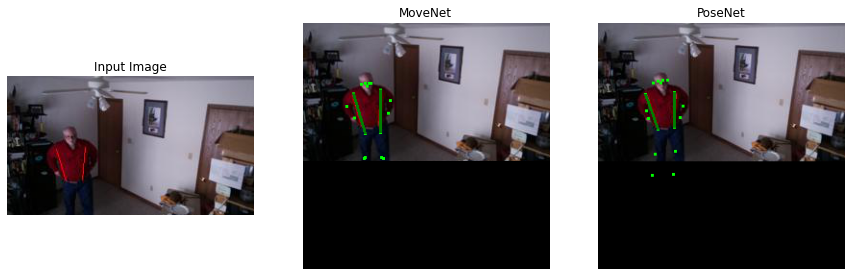


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.563815         0.644333    0.536523    0.575943   
posenet         0.932518         0.951447    0.859028    0.974499   

         Inference_time  
movenet        0.218163  
posenet        0.136614  



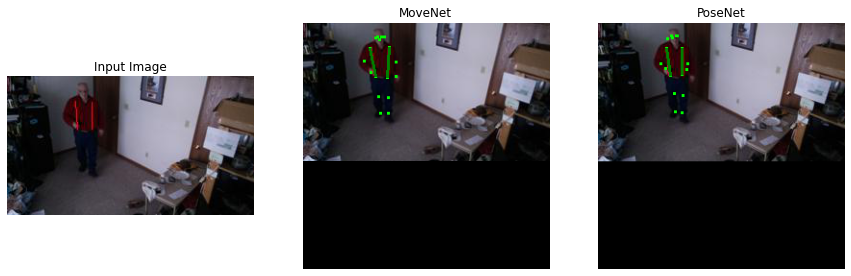


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.608532         0.695414    0.584077    0.577192   
posenet         0.994645         0.998270    0.990977    0.988087   

         Inference_time  
movenet        0.207412  
posenet        0.097498  



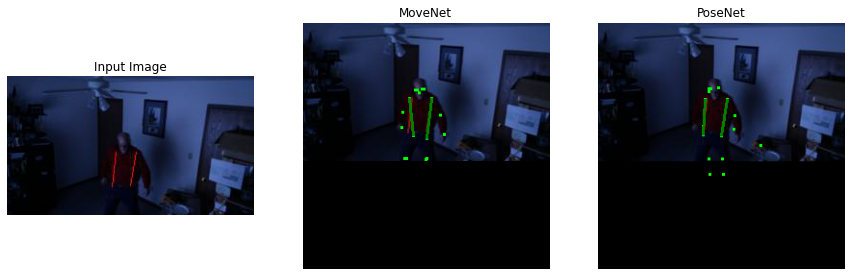


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.664439         0.450120    0.566758    0.627638   
posenet         0.909101         0.721479    0.985621    0.808457   

         Inference_time  
movenet        0.178408  
posenet        0.089917  



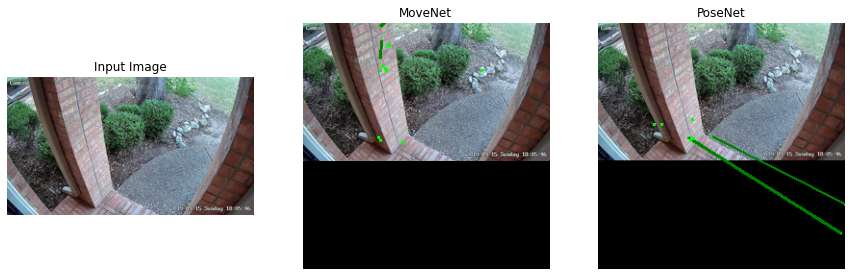


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.011379         0.027955    0.012385    0.031742   
posenet         0.003143         0.001506    0.009571    0.006482   

         Inference_time  
movenet        0.152595  
posenet        0.098059  



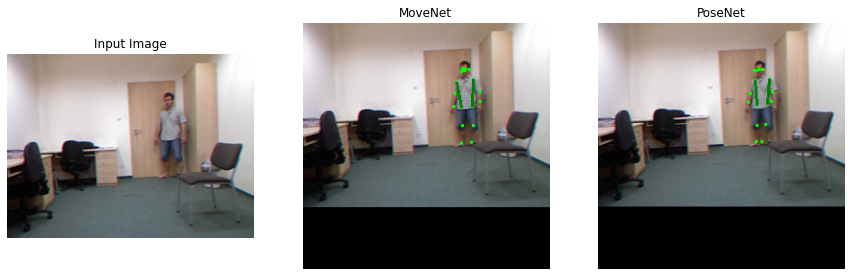


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.368593         0.407846    0.507244    0.531825   
posenet         0.900541         0.994566    0.941537    0.994153   

         Inference_time  
movenet        0.180161  
posenet        0.106574  



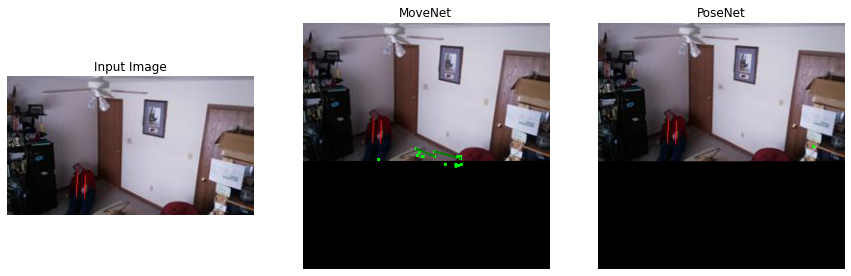


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.194734         0.153795    0.137528    0.105855   
posenet         0.003191         0.005295    0.004226    0.005557   

         Inference_time  
movenet        0.213720  
posenet        0.135486  



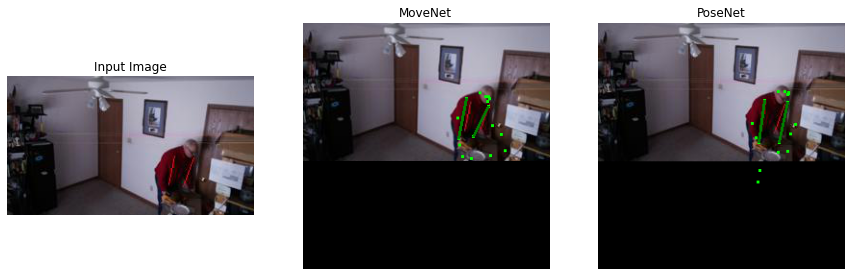


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.452736         0.561611    0.615250    0.632143   
posenet         0.927438         0.873117    0.944495    0.948101   

         Inference_time  
movenet        0.181826  
posenet        0.092486  



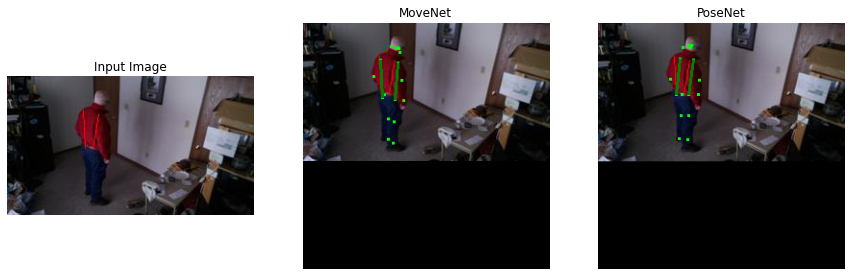


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.484825         0.600958    0.633971    0.499900   
posenet         0.782442         0.947943    0.930646    0.991978   

         Inference_time  
movenet        0.181932  
posenet        0.094933  



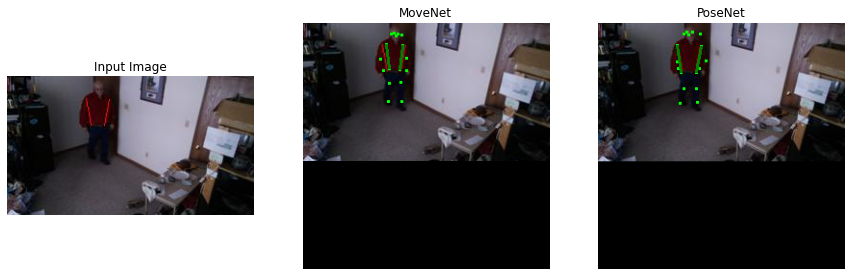


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.422470         0.647567    0.642165    0.616534   
posenet         0.941262         0.934462    0.984502    0.965508   

         Inference_time  
movenet        0.174695  
posenet        0.107088  



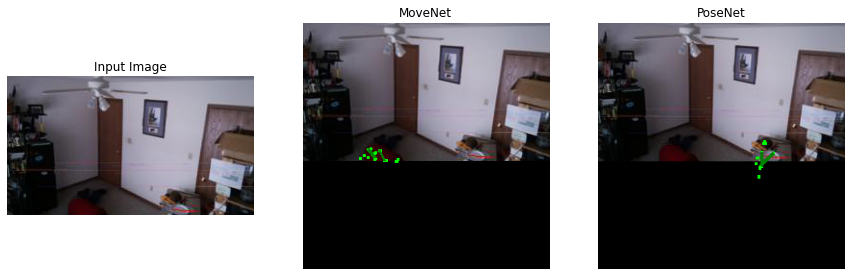


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.287767         0.225122    0.151572    0.131170   
posenet         0.049259         0.039406    0.015937    0.019279   

         Inference_time  
movenet        0.190722  
posenet        0.106650  



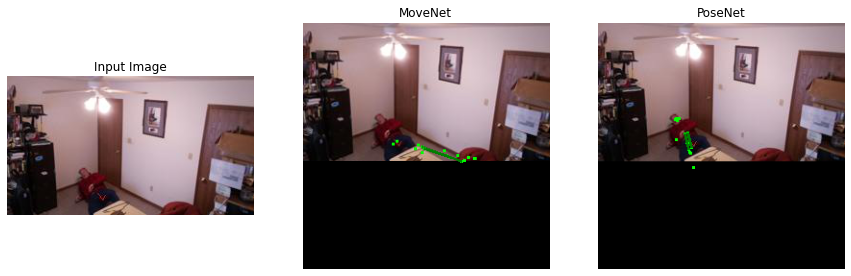


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.097631         0.090283    0.114825    0.156921   
posenet         0.133590         0.085984    0.109510    0.137726   

         Inference_time  
movenet        0.272382  
posenet        0.148405  



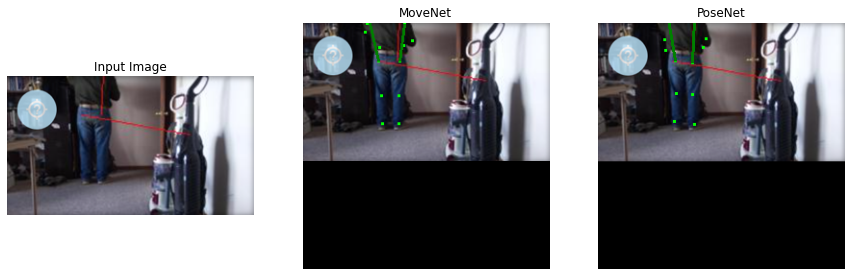


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.168734         0.167558    0.614498    0.572879   
posenet         0.645109         0.945679    0.892022    0.992411   

         Inference_time  
movenet        0.282112  
posenet        0.135011  



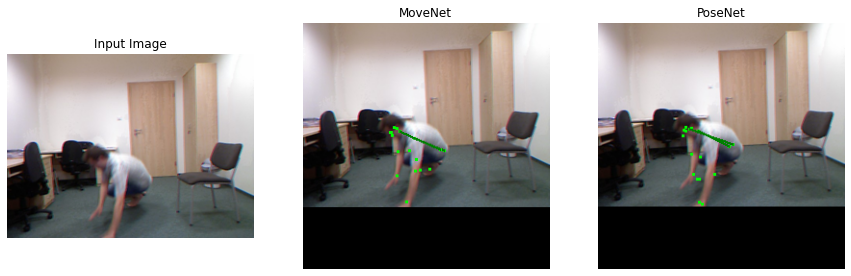


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.628801         0.674815    0.619654    0.794412   
posenet         0.955991         0.907969    0.850242    0.781131   

         Inference_time  
movenet        0.226811  
posenet        0.137958  



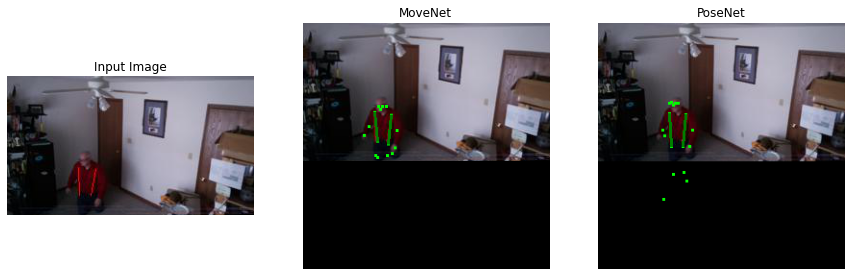


         LShoulder_score  RShoulder_score  LHip_score  RHip_score  \
movenet         0.361242         0.604967    0.296043    0.329390   
posenet         0.987998         0.953838    0.964929    0.861641   

         Inference_time  
movenet        0.264213  
posenet        0.152284  



In [7]:
import os
DATADIR = 'Images'
comparison_df = pd.DataFrame()

for template_path in os.listdir(DATADIR):
  
    template_image_src = Image.open(os.path.join(DATADIR,template_path))  
    
    _thumbnail, movenet_output_image, movenet_scoreList, movenet_inference_time = movenet_pose_engine.get_result(template_image_src)
    
    _thumbnail, posenet_output_image, posenet_scoreList, posenet_inference_time = mobilenet_pose_engine.get_result(template_image_src)

    
    movenet_scoreList['Inference_time'] = movenet_inference_time
    posenet_scoreList['Inference_time'] = posenet_inference_time
    
    scoreList_table = pd.DataFrame(data = [movenet_scoreList, posenet_scoreList],
                                   columns = ['LShoulder_score','RShoulder_score','LHip_score','RHip_score',
                                              'Inference_time'], 
                                   index=['movenet','posenet'])
    
    fig = plt.figure(figsize=(15,9))
    fig.add_subplot(1, 3, 1)
    plt.imshow(_thumbnail)    
    plt.axis("off")
    plt.title("Input Image")

    fig.add_subplot(1, 3, 2)
    plt.imshow(movenet_output_image)    
    plt.axis("off")
    plt.title("MoveNet")        

    fig.add_subplot(1, 3, 3)
    plt.imshow(posenet_output_image)    
    plt.axis("off")
    plt.title("PoseNet")        
    
    plt.show()
    
    
    print()
    print(scoreList_table)
    print()

    idx = scoreList_table.index.to_frame()
    idx.insert(0, 'image', template_path)
    idx.insert(1, 'model', ['movenet','posenet'])
    scoreList_table = scoreList_table.set_index(pd.MultiIndex.from_frame(idx),drop=True).droplevel(2)
    comparison_df = comparison_df.append(scoreList_table)

In [8]:
comparison_df

LShoulder_score  RShoulder_score  LHip_score  \
image           model                                                   
fall_img_46.png movenet         0.681930         0.584232    0.564108   
                posenet         0.693424         0.361835    0.746721   
fall_img_2.png  movenet         0.551457         0.685538    0.571250   
                posenet         0.984250         0.821950    0.874787   
fall_img_31.jpg movenet         0.514819         0.482569    0.634595   
                posenet         0.816953         0.787055    0.619340   
fall_img_45.jpg movenet         0.293247         0.280728    0.428216   
                posenet         0.080133         0.064593    0.137335   
fall_img_43.jpg movenet         0.291344         0.409784    0.505634   
                posenet         0.358750         0.380527    0.474331   
fall_img_27.jpg movenet         0.385434         0.443161    0.457041   
                posenet         0.993103         0.882560    0.989262   
fall_img_36.jpg movenet         0.579216         0.608703    0.172724   
                posenet         0.437934         0.132671    0.211096   
fall_img_18.png movenet         0.671805         0.560217    0.708826   
                posenet         0.994041         0.837409    0.998104   
fall_img_6.png  movenet         0.574028         0.661798    0.480063   
                posenet         0.966646         0.948529    0.926106   
fall_img_38.jpg movenet         0.404683         0.323302    0.628407   
                posenet         0.994282         0.981373    0.995236   
fall_img_22.jpg movenet         0.060427         0.090580    0.245573   
                posenet         0.064809         0.060697    0.029433   
fall_img_8.png  movenet         0.576427         0.593523    0.652052   
                posenet         0.999428         0.971296    0.929319   
fall_img_41.jpg movenet         0.482163         0.407907    0.389751   
                posenet         0.676122         0.718254    0.509295   
fall_img_29.jpg movenet         0.411386         0.387540    0.387879   
                posenet         0.028315         0.037679    0.026444   
fall_img_9.png  movenet         0.272308         0.308843    0.197491   
                posenet         0.011118         0.017692    0.005691   
fall_img_19.png movenet         0.065165         0.159040    0.078886   
                posenet         0.640908         0.661787    0.309637   
fall_img_42.jpg movenet         0.475422         0.576229    0.795357   
                posenet         0.522550         0.907768    0.935941   
fall_img_1.png  movenet         0.722023         0.518078    0.559009   
                posenet         0.993478         0.997292    0.993563   
fall_img_39.jpg movenet         0.463635         0.651494    0.533021   
                posenet         0.990964         0.883968    0.999335   
fall_img_5.png  movenet         0.649309         0.577869    0.570143   
                posenet         0.984572         0.941343    0.940407   
fall_img_26.jpg movenet         0.351813         0.285502    0.257873   
                posenet         0.789852         0.866329    0.808955   
fall_img_47.png movenet         0.698905         0.492374    0.528614   
                posenet         0.955995         0.962668    0.846824   
fall_img_23.jpg movenet         0.060427         0.090580    0.245573   
                posenet         0.064809         0.060697    0.029433   
fall_img_48.png movenet         0.705921         0.629297    0.577361   
                posenet         0.890897         0.707792    0.991340   
fall_img_28.jpg movenet         0.709016         0.488555    0.673661   
                posenet         0.832334         0.937849    0.724507   
fall_img_7.png  movenet         0.467571         0.432706    0.533694   
                posenet         0.938513         0.992204    0.895669   
fall_img_4.png  movenet         0.203492         0.159095    0.293808   
          

# Fall-Detection on Video Samples

In [9]:
def show_frames(frame_list):
    
    frame_list = frame_list[-50:]
        
    frame_to_display = len(frame_list) 
    columns = 6
    rows = (frame_to_display // columns) + 1
    
    fig = plt.figure(figsize=(20, 33))

    plt_cnt = 1

    for i in range(0, len(frame_list)):

        fig.add_subplot(rows, columns, plt_cnt)
        plt.axis("off")
        plt.title(f"Frame: {plt_cnt}")        
        plt.imshow(frame_list[i])

        plt_cnt += 1

In [10]:
def movenet_execution_for_video(video_path):
    
    cam = cv2.VideoCapture(video_path)
    currentframe = 0

    output_frame_sequences = []

    while(True):

        ret,frame = cam.read()

        if ret:
            name = str(currentframe) + '.jpg'
            currentframe += 1

            template_image_src = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)    
            template_image_src = Image.fromarray(template_image_src)

            _thumbnail, movenet_output_image, movenet_scoreList, movenet_inference_time = movenet_pose_engine.get_result(template_image_src)
            temp_score = sum([ 1 if e> 0.5 else 0 for e in list(movenet_scoreList.values())])

#             if temp_score < 2:
#                 continue

            output_frame_sequences.append(movenet_output_image)

        else:
            break


    cam.release()
    cv2.destroyAllWindows()
    
    show_frames(output_frame_sequences)

In [11]:
def posenet_execution_for_video(video_path):
    
    cam = cv2.VideoCapture(video_path)
    currentframe = 0

    output_frame_sequences = []

    while(True):

        ret,frame = cam.read()

        if ret:
            name = str(currentframe) + '.jpg'
            currentframe += 1

            template_image_src = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)    
            template_image_src = Image.fromarray(template_image_src)
        
            _thumbnail, posenet_output_image, posenet_scoreList, posenet_inference_time = mobilenet_pose_engine.get_result(template_image_src)
            temp_score = sum([ 1 if e> 0.5 else 0 for e in list(posenet_scoreList.values())])

#             if temp_score < 2:
#                 continue

            output_frame_sequences.append(posenet_output_image)

        else:
            break


    cam.release()
    cv2.destroyAllWindows()
    
    show_frames(output_frame_sequences)

# video -1

Posenet 



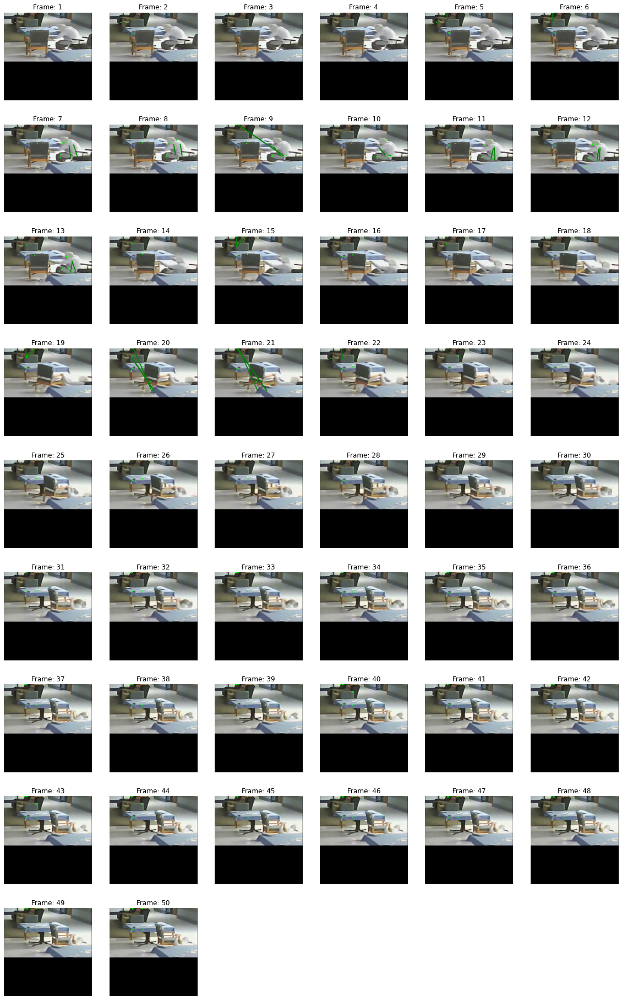

In [12]:
print("Posenet \n")
posenet_execution_for_video('videos/video_1.mp4')

Movenet 



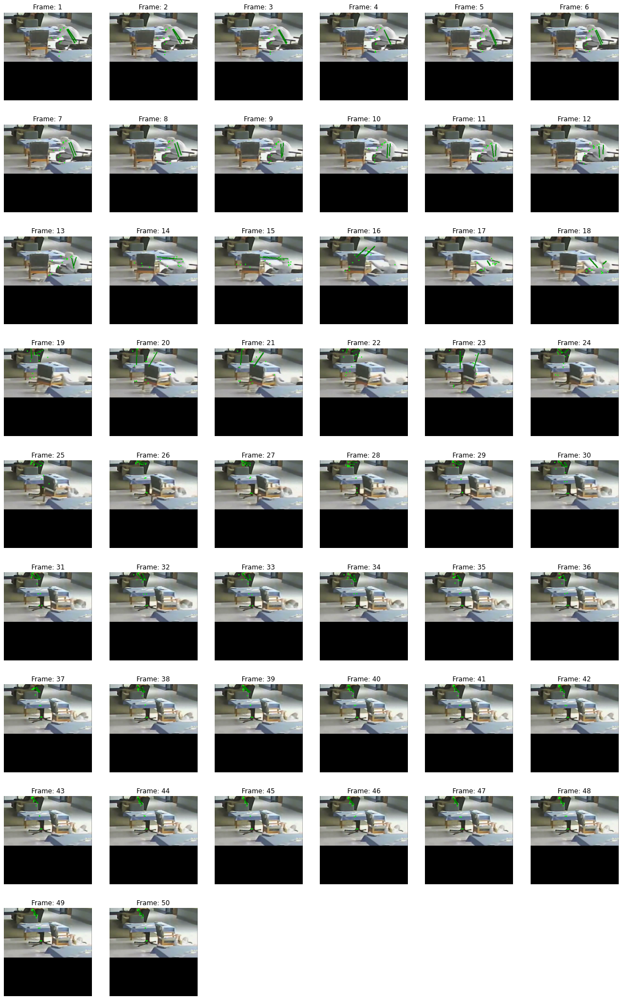

In [13]:
print("Movenet \n")
movenet_execution_for_video('videos/video_1.mp4')

# video - 2

Posenet 



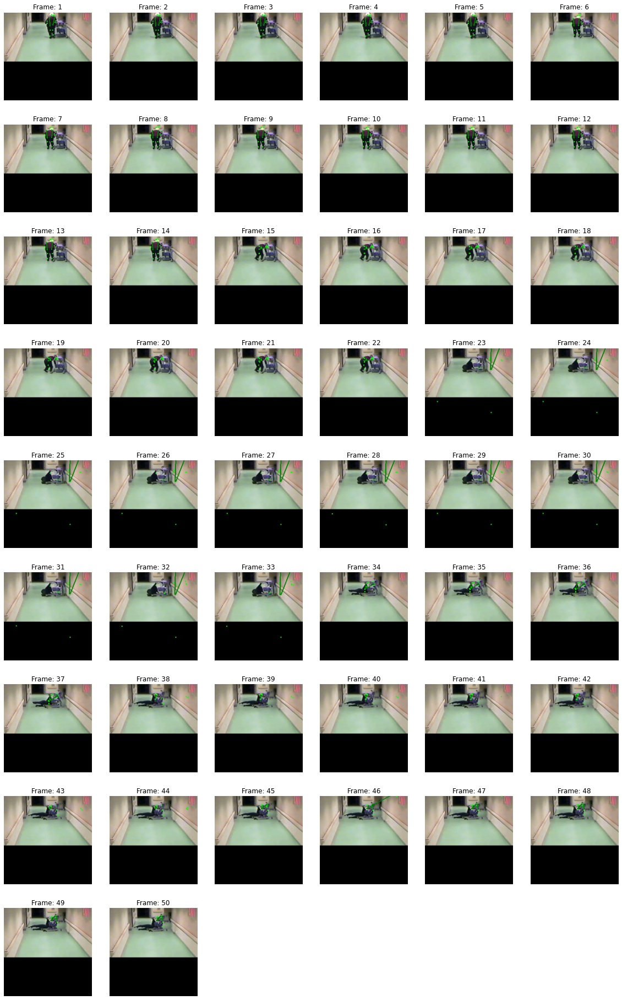

In [14]:
print("Posenet \n")
posenet_execution_for_video('videos/video_2.mp4')

Movenet 



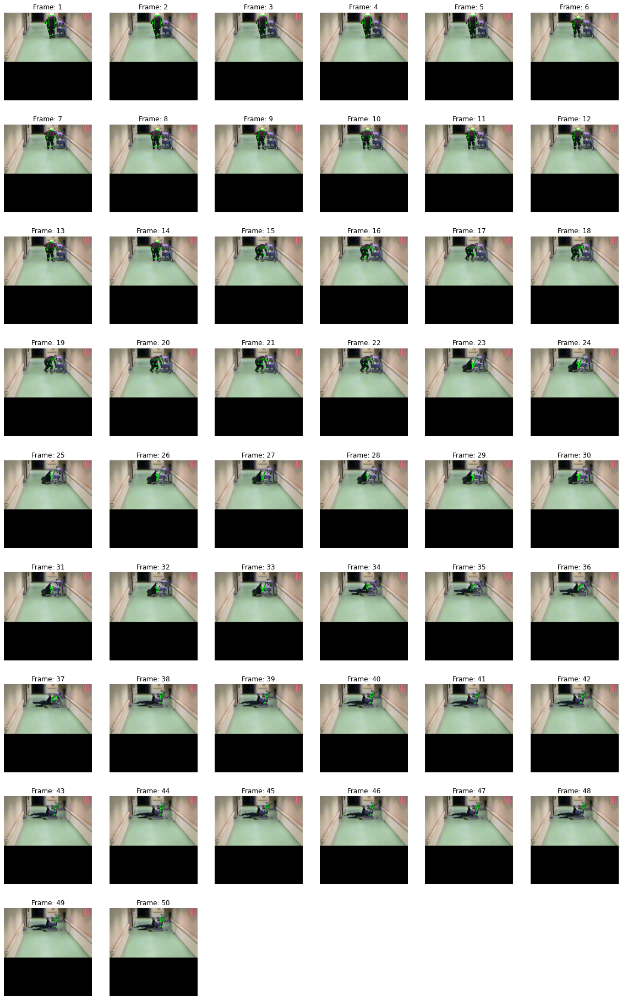

In [15]:
print("Movenet \n")
movenet_execution_for_video('videos/video_2.mp4')

# video - 3

Posenet 



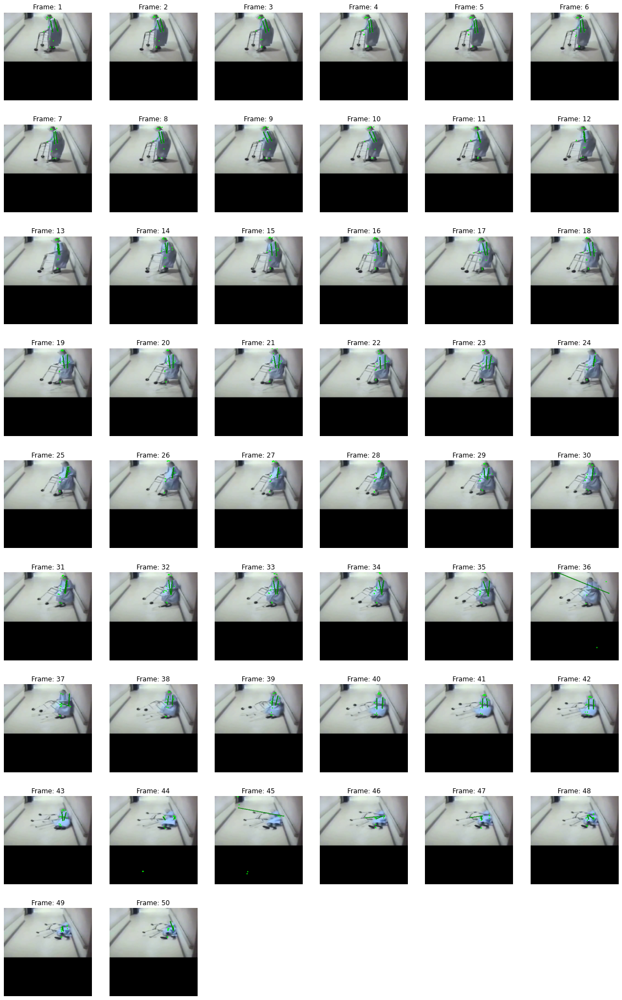

In [16]:
print("Posenet \n")
posenet_execution_for_video('videos/video_3.mp4')

Movenet 



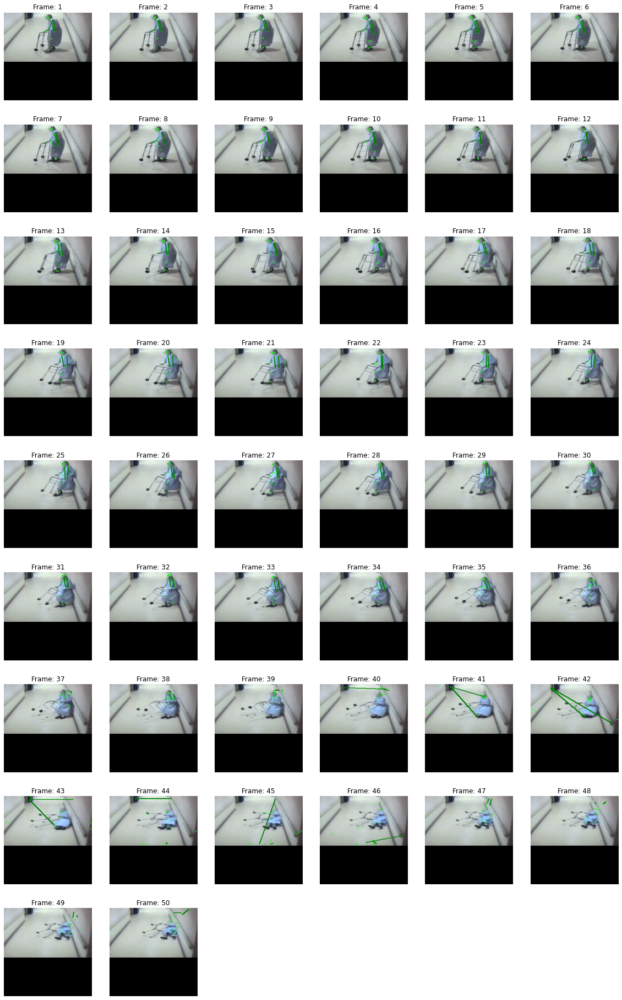

In [17]:
print("Movenet \n")
movenet_execution_for_video('videos/video_3.mp4')

# video - 4

Posenet 



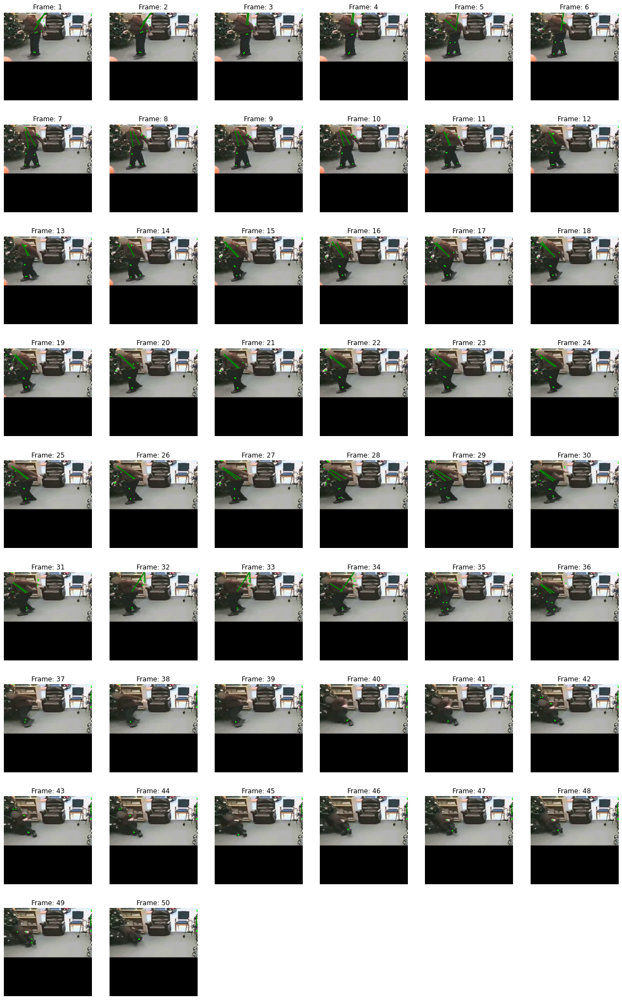

In [18]:
print("Posenet \n")
posenet_execution_for_video('videos/video_4.mp4')

Movenet 



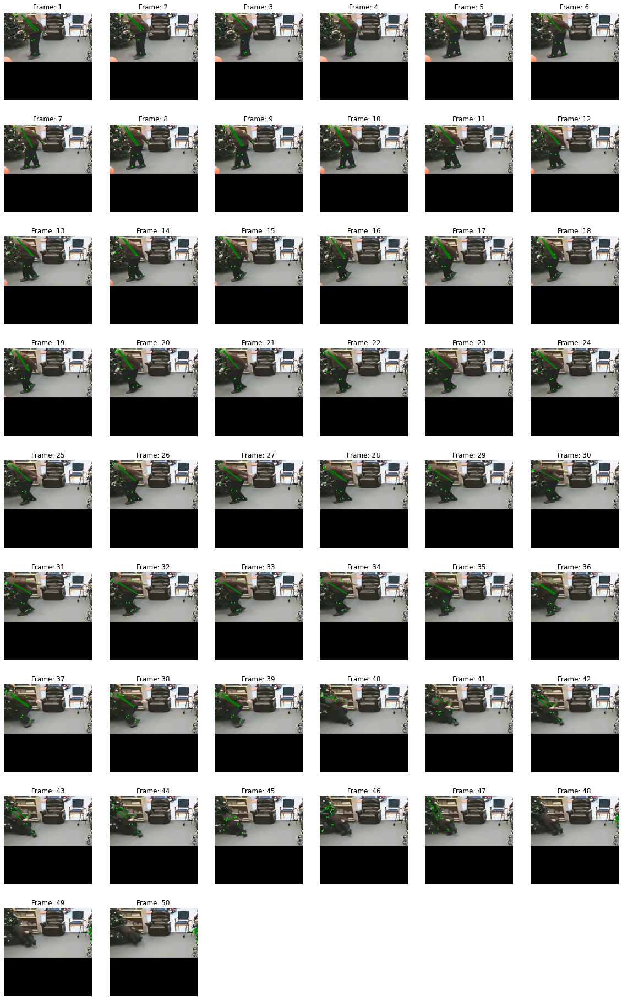

In [19]:
print("Movenet \n")
movenet_execution_for_video('videos/video_4.mp4')

# video - 5

Posenet 



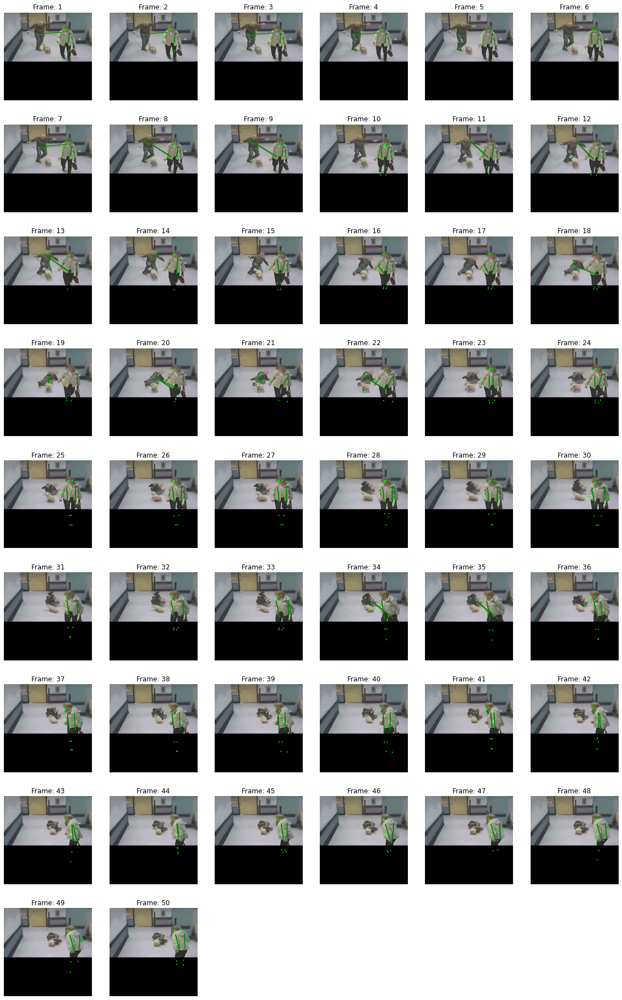

In [20]:
print("Posenet \n")
posenet_execution_for_video('videos/video_5.mp4')

Movenet 



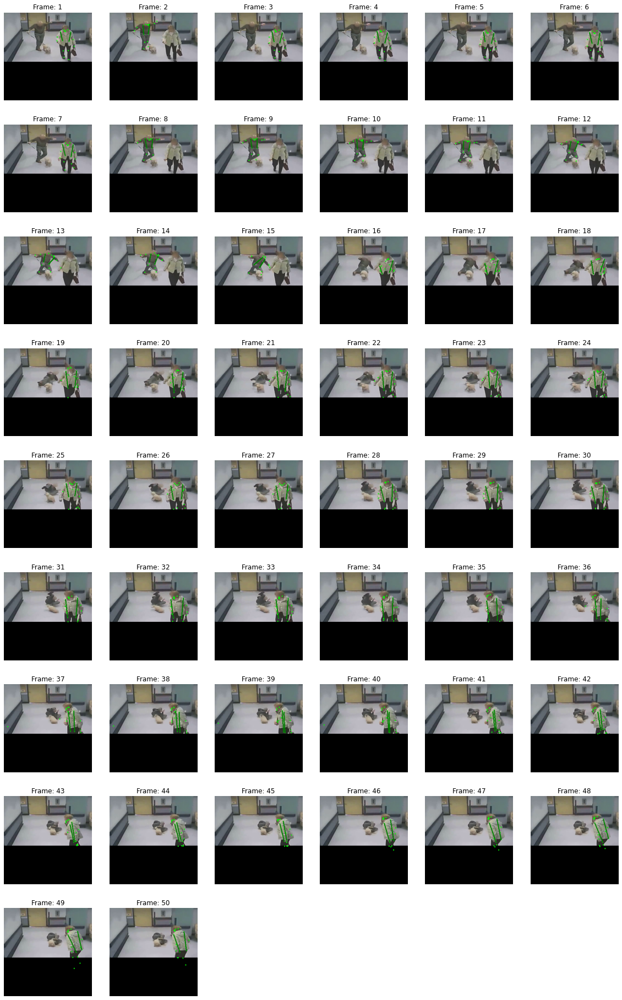

In [21]:
print("Movenet \n")
movenet_execution_for_video('videos/video_5.mp4')